In [61]:
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, LabelBinarizer
import os

from sklearn.model_selection import train_test_split,  GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import zero_one_loss, log_loss, classification_report, confusion_matrix, accuracy_score
from scipy.stats import randint


In [24]:
# Load the annotation data
df = pd.read_csv('label_annotations.csv')


In [25]:
df.head(5)

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
0,crop,23,461,341,201,imgs-00001.jpg,2160,3840
1,crop,390,481,273,174,imgs-00001.jpg,2160,3840
2,crop,233,353,337,120,imgs-00001.jpg,2160,3840
3,crop,617,391,145,87,imgs-00001.jpg,2160,3840
4,crop,793,107,676,634,imgs-00001.jpg,2160,3840


In [26]:
df.shape

(5423, 8)

In [27]:
# Unique Images
unique_images = df.image_name.unique()

In [28]:
unique_images.shape

(1196,)

In [29]:
unique_images[5]

'imgs-00006.jpg'

In [30]:
df_unique_images = pd.DataFrame(unique_images, columns = ['image_name'])

print(df_unique_images)

          image_name
0     imgs-00001.jpg
1     imgs-00002.jpg
2     imgs-00003.jpg
3     imgs-00004.jpg
4     imgs-00005.jpg
...              ...
1191  imgs-03107.jpg
1192  imgs-03108.jpg
1193  imgs-03109.jpg
1194  imgs-03110.jpg
1195  imgs-03111.jpg

[1196 rows x 1 columns]


In [31]:
df_unique_images.to_csv('df_unique_images.csv')

In [32]:
df_unique_images.head(5)

,image_name
0,imgs-00001.jpg
1,imgs-00002.jpg
2,imgs-00003.jpg
3,imgs-00004.jpg
4,imgs-00005.jpg


In [33]:
df_unique_images.shape

(1196, 1)

In [34]:
df.head(5)

,label_name,bbox_x,bbox_y,bbox_width,bbox_height,image_name,image_width,image_height
0,crop,23,461,341,201,imgs-00001.jpg,2160,3840
1,crop,390,481,273,174,imgs-00001.jpg,2160,3840
2,crop,233,353,337,120,imgs-00001.jpg,2160,3840
3,crop,617,391,145,87,imgs-00001.jpg,2160,3840
4,crop,793,107,676,634,imgs-00001.jpg,2160,3840


In [35]:
# Check for the grass and crop labels

df[df['label_name'] == 'crop'].shape

(3212, 8)

In [36]:
df[df['label_name'] == 'grass'].shape

(2211, 8)

In [37]:
def delete_images_not_in_dataframe(folder_path, dataframe, image_column):
    """
    Deletes images in the specified folder that do not appear in the given dataframe.
    
    Arguments:
    - folder_path: The path to the folder containing the images.
    - dataframe: The pandas dataframe containing the image filenames.
    - image_column: The name of the column in the dataframe that contains the image filenames.
    """
    # Get the list of image filenames from the dataframe
    image_filenames = dataframe[image_column].tolist()

    # Get the list of image files in the folder
    image_files = os.listdir(folder_path)

    # Iterate over the image files in the folder
    for file in image_files:
        # Check if the file is an image
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
            # Check if the image filename is not in the dataframe
            if file not in image_filenames:
                # Construct the full file path
                file_path = os.path.join(folder_path, file)
                # Delete the image file
                os.remove(file_path)
                print(f"Deleted file: {file_path}")

In [38]:
folder_path = "./data/"
dataframe = df_unique_images
image_column = "image_name"

# delete_images_not_in_dataframe(folder_path, dataframe, image_column)

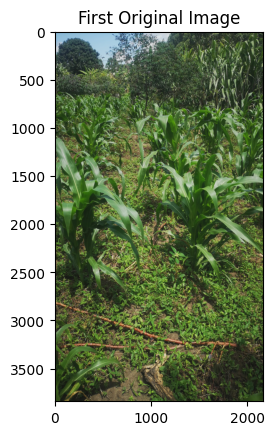

In [39]:
# For simplicity, consider the first image and its annotations
image_path = df['image_name'].iloc[0]
image = cv2.imread('./data/' + image_path)

# Convert color since OpenCV uses BGR instead of RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot the original image
plt.imshow(image)
plt.title('First Original Image')
plt.show()

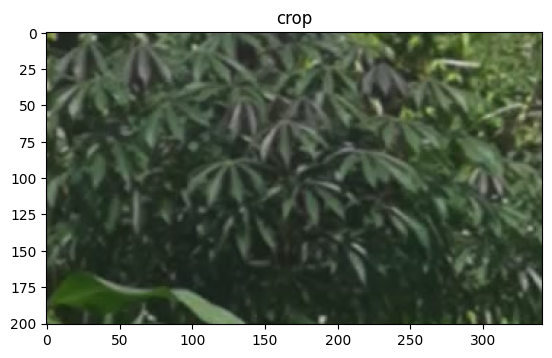

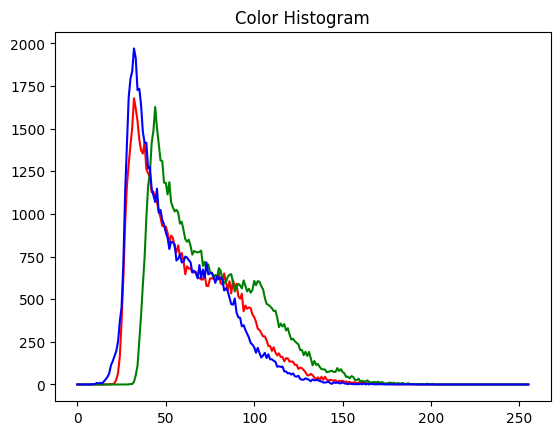

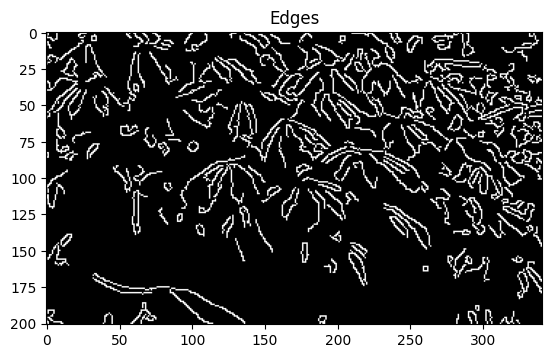

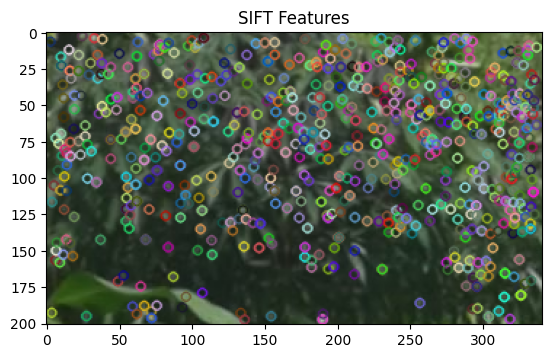

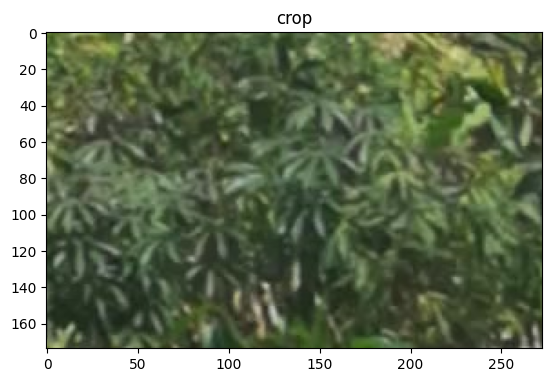

...

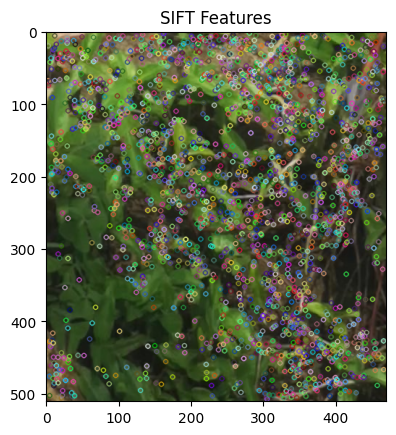

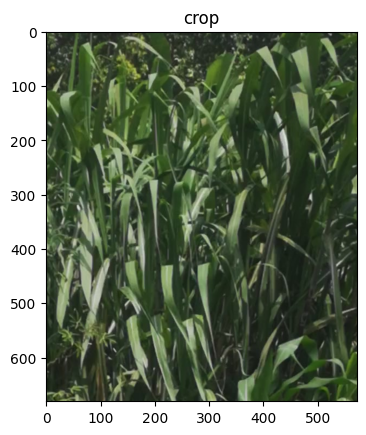

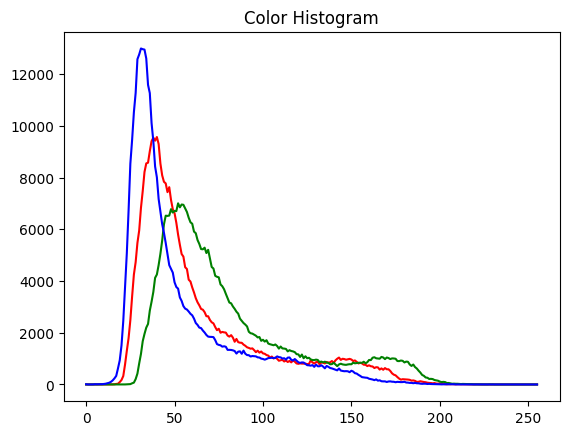

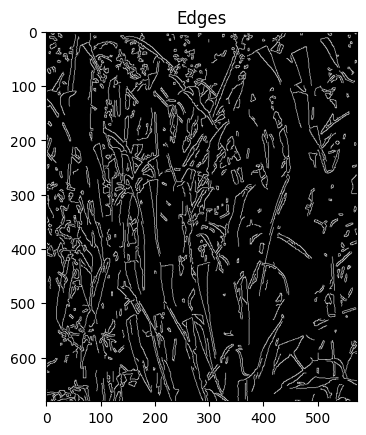

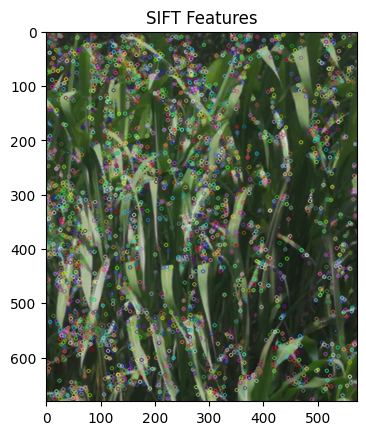

In [40]:
# For each crop and grass in the image
for i, row in df[df['image_name'] == image_path].iterrows():
    # Get the bounding box
    bbox_x = row['bbox_x']
    bbox_y = row['bbox_y']
    bbox_width = row['bbox_width']
    bbox_height = row['bbox_height']

    # Crop the image
    crop = image[bbox_y:bbox_y+bbox_height, bbox_x:bbox_x+bbox_width]
    
    # Show the cropped image
    plt.imshow(crop)
    plt.title(row['label_name'])
    plt.show()

    # Calculate and plot color histogram for each color channel
    for i, color in enumerate(['r', 'g', 'b']):
        hist = cv2.calcHist([crop], [i], None, [256], [0,256])
        plt.plot(hist, color=color)
    plt.title('Color Histogram')
    plt.show()

    # Apply Canny edge detection and show the result
    edges = cv2.Canny(crop, 100, 200)
    plt.imshow(edges, cmap='gray')
    plt.title('Edges')
    plt.show()

    # SIFT features
    sift = cv2.SIFT_create()
    kp_sift, des_sift = sift.detectAndCompute(crop, None)
    img_sift = cv2.drawKeypoints(crop, kp_sift, crop)
    plt.imshow(img_sift)
    plt.title('SIFT Features')
    plt.show()

    # SURF features
    # surf = cv2.SURF_create()
    # kp_surf, des_surf = surf.detectAndCompute(crop, None)
    # img_surf = cv2.drawKeypoints(crop, kp_surf, crop)
    # plt.imshow(img_surf)
    # plt.title('SURF Features')
    # plt.show()

### Feature Extraction

In [41]:
def extract_features(image, bbox):
    # Crop the image
    crop = image[bbox[1]:bbox[3], bbox[0]:bbox[2]]

    # Check if the crop is empty
    if crop.size == 0:
        print(f"Empty crop for bounding box {bbox}")
        return None

    # Calculate color histogram
    color_hist = cv2.calcHist([crop], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    color_hist = cv2.normalize(color_hist, color_hist).flatten()

    # Apply Canny edge detection, calculate histogram and flatten it
    edges = cv2.Canny(crop, 100, 200)
    edge_hist = np.histogram(edges, bins=256, range=(0,256))[0]
    edge_hist = MinMaxScaler().fit_transform(edge_hist.reshape(-1, 1)).flatten()

    # Combine the features into a single feature vector
    return np.concatenate([color_hist, edge_hist])


In [42]:
X = []  # Feature vectors
y = []  # Labels

for index, row in df.iterrows():
    image_name = row['image_name']
    label = row['label_name']
    bbox = [row['bbox_x'], row['bbox_y'], row['bbox_x'] + row['bbox_width'], row['bbox_y'] + row['bbox_height']]

    # Load the image
    image = cv2.imread('./data/' + image_name)
    
    # Check if image is loaded correctly
    if image is None:
        print(f"Image {image_name} could not be loaded.")
        continue
    
    # Extract features and add them to the dataset
    features = extract_features(image, bbox)
    if features is not None:
        X.append(features)
        y.append(label)

# Convert lists to numpy arrays for use with scikit-learn
X = np.array(X)
y = np.array(y)

### Splitting inot Train, Validation and test sets

In [43]:
# Split the dataset into training, validation, and test sets
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

### KNN Model

In [44]:
# Initialize the KNN model. Let's use K=5 for this example

knn = KNeighborsClassifier(n_neighbors=5)

In [45]:
# Train the model
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [46]:
# Validate the model
y_val_pred = knn.predict(X_val)
print("Validation Set Performance:")
print(classification_report(y_val, y_val_pred))
print(confusion_matrix(y_val, y_val_pred))

Validation Set Performance:
              precision    recall  f1-score   support

        crop       0.96      0.94      0.95       632
       grass       0.91      0.94      0.93       453

    accuracy                           0.94      1085
   macro avg       0.93      0.94      0.94      1085
weighted avg       0.94      0.94      0.94      1085

[[591  41]
 [ 27 426]]


In [47]:
class_names = np.unique(y)

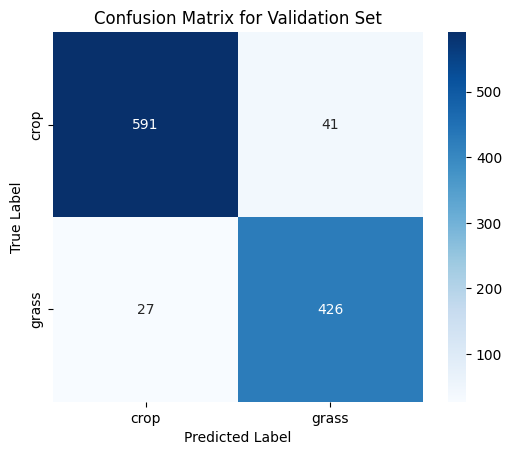

In [48]:
conf_mat = confusion_matrix(y_val, y_val_pred) 
plt.imshow(conf_mat, cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Validation Set')
sns.heatmap(conf_mat, annot=True,fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [49]:
# Test the model
y_test_pred = knn.predict(X_test)
print("Test Set Performance:")
print(classification_report(y_test, y_test_pred))
print(confusion_matrix(y_test, y_test_pred))

Test Set Performance:
              precision    recall  f1-score   support

        crop       0.95      0.95      0.95       653
       grass       0.92      0.92      0.92       432

    accuracy                           0.94      1085
   macro avg       0.93      0.93      0.93      1085
weighted avg       0.94      0.94      0.94      1085

[[620  33]
 [ 35 397]]


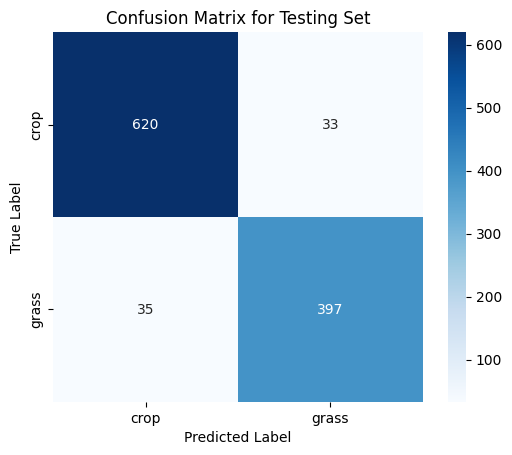

In [50]:
conf_mat = confusion_matrix(y_test, y_test_pred)
plt.imshow(conf_mat, cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Testing Set')
sns.heatmap(conf_mat, annot=True,fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [51]:
train_accuracies = []
val_accuracies = []

k_values = range(1, 21)  # Check k values from 1 to 20

for k in k_values:
    # Initialize the KNN model
    knn = KNeighborsClassifier(n_neighbors=k)

    # Train the model
    knn.fit(X_train, y_train)

    # Compute accuracy on the training set
    train_pred = knn.predict(X_train)
    train_accuracy = accuracy_score(y_train, train_pred)
    train_accuracies.append(train_accuracy)

    # Compute accuracy on the validation set
    val_pred = knn.predict(X_val)
    val_accuracy = accuracy_score(y_val, val_pred)
    val_accuracies.append(val_accuracy)


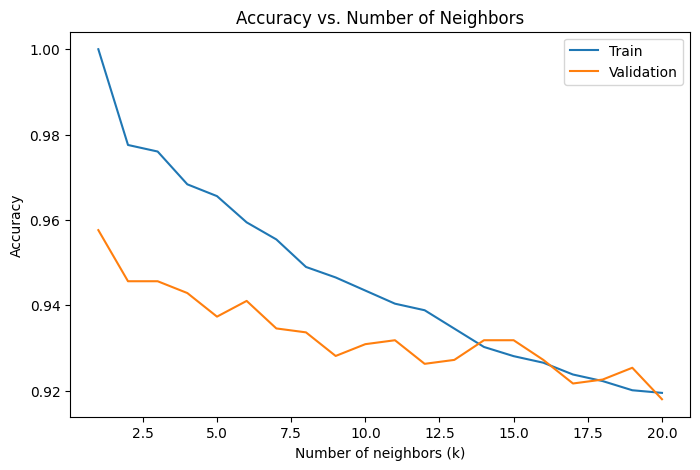

In [65]:
# Plot the accuracies
plt.figure(figsize=(8, 5))
plt.plot(k_values, train_accuracies, label='Train')
plt.plot(k_values, val_accuracies, label='Validation')
plt.xlabel('Number of neighbors (k)')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy vs. Number of Neighbors')
plt.show()

In [53]:
k_values = range(1, 21)
train_losses = []
val_losses = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)

    train_pred = knn.predict(X_train)
    val_pred = knn.predict(X_val)

    train_loss = zero_one_loss(y_train, train_pred)
    val_loss = zero_one_loss(y_val, val_pred)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

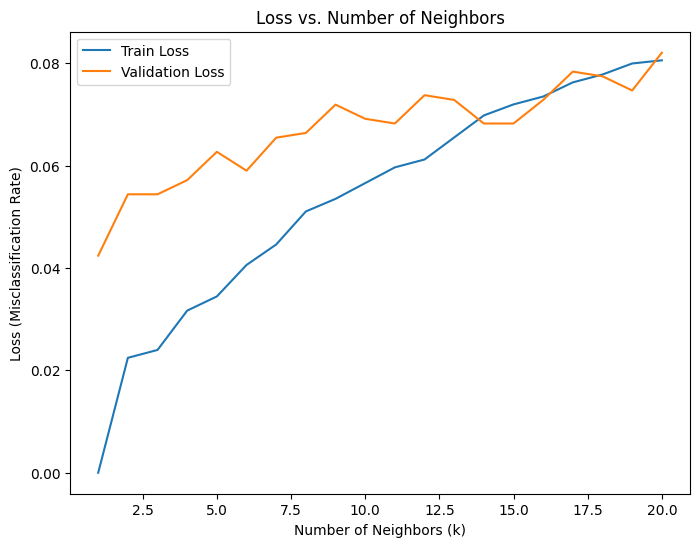

In [67]:
plt.figure(figsize=(8, 6))
plt.plot(k_values, train_losses, label='Train Loss')
plt.plot(k_values, val_losses, label='Validation Loss')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Loss (Misclassification Rate)')
plt.title('Loss vs. Number of Neighbors')
plt.legend()
plt.show()

In [56]:
# Define the parameter values that should be searched
k_range = list(range(1, 31))

# Create a parameter grid: map the parameter names to the values that should be searched
param_grid = dict(n_neighbors=k_range)

# Instantiate the grid
grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=10, scoring='accuracy')

# Fit the grid with data
grid.fit(X, y)

# View the best parameters
print("Best parameters: ", grid.best_params_)
print("Best cross-validation score: ", grid.best_score_)

Best parameters:  {'n_neighbors': 11}
Best cross-validation score:  0.8340210529177116


In [57]:
# Define the parameter range for n_neighbors (1 to 30)
param_dist = {"n_neighbors": randint(1, 30)}

# Instantiate the RandomizedSearchCV object
rand = RandomizedSearchCV(KNeighborsClassifier(), param_dist, cv=10, scoring='accuracy', n_iter=10, random_state=5)

# Fit the RandomizedSearchCV object to the data
rand.fit(X, y)

# Print the best parameters and best score
print("Best parameters: ", rand.best_params_)
print("Best score: ", rand.best_score_)

Best parameters:  {'n_neighbors': 9}
Best score:  0.8330965049981993


### Evaluationn After Tuning

In [58]:
# Instantiate the model with the best parameters
hp_knn = KNeighborsClassifier(n_neighbors=5)

# Fit the model with training data
hp_knn.fit(X_train, y_train)

# Predict on the validation data
y_pred = hp_knn.predict(X_val)

# Predict on the validation data
y_pred = hp_knn.predict(X_val)

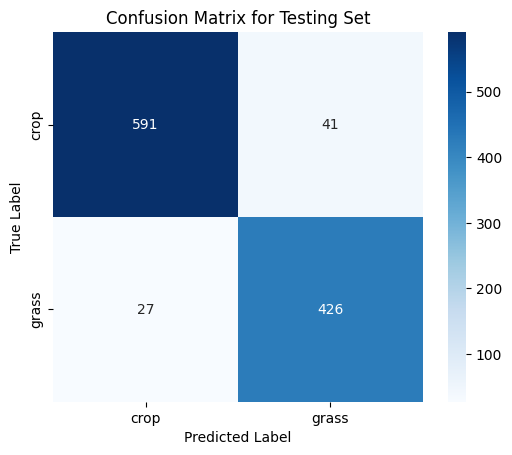

In [59]:
# Use seaborn to plot the confusion matrix
cm = confusion_matrix(y_val, y_pred)
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Testing Set')
sns.heatmap(cm, annot=True,fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [62]:
# Assuming best_params_ is the output of your GridSearchCV or RandomizedSearchCV
best_n_neighbors = grid.best_params_['n_neighbors']

# List of neighbor values to try
neighbors = list(range(1, best_n_neighbors + 1))

# Store cross-validated accuracies
cv_scores = []
test_scores = []

# Store cross-validated error rates
cv_error_rates = []
test_error_rates = []

for k in neighbors:
    hpp_knn = KNeighborsClassifier(n_neighbors=k)
    hpp_knn.fit(X_train, y_train)
    
    # Validation accuracy
    scores = cross_val_score(hpp_knn, X_train, y_train, cv=5, scoring='accuracy')
    cv_scores.append(scores.mean())
    # Errors
    cv_error_rates.append(1 - scores.mean())
    
    # Test accuracy
    y_pred_test = hpp_knn.predict(X_test)
    test_scores.append(accuracy_score(y_test, y_pred_test))
    # Errors
    test_error_rates.append(1 - accuracy_score(y_test, y_pred_test))

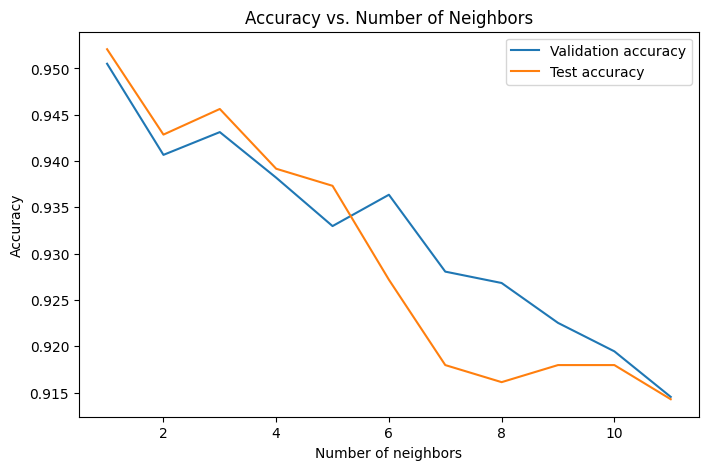

In [68]:
# Plot accuracy vs number of neighbors
plt.figure(figsize=(8, 5))
plt.plot(neighbors, cv_scores, label="Validation accuracy")
plt.plot(neighbors, test_scores, label="Test accuracy")
plt.xlabel("Number of neighbors")
plt.ylabel("Accuracy")
plt.legend()
plt.title('Accuracy vs. Number of Neighbors')
plt.show()

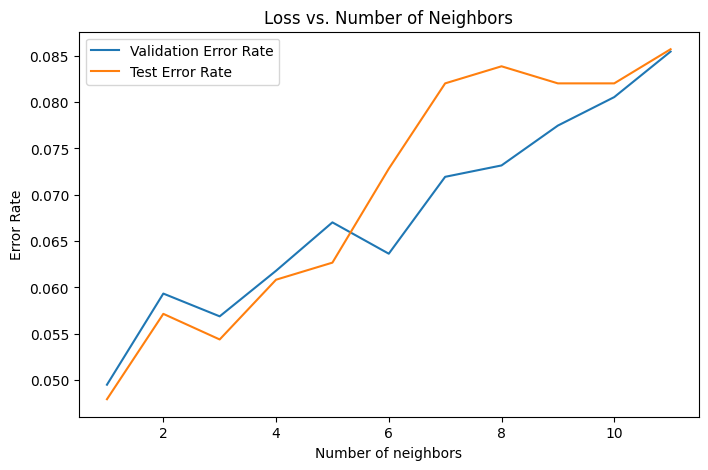

In [70]:
# Plot error rate vs number of neighbors
plt.figure(figsize=(8, 5))
plt.plot(neighbors, cv_error_rates, label="Validation Error Rate")
plt.plot(neighbors, test_error_rates, label="Test Error Rate")
plt.xlabel("Number of neighbors")
plt.ylabel("Error Rate")
plt.legend()
plt.title('Loss vs. Number of Neighbors')
plt.show()